In [ ]:
import torch
print("GPU available:", torch.cuda.is_available())
print("GPU name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "none")

GPU available: True
GPU name: Tesla T4


In [ ]:
!git clone https://github.com/itz-deeptanshu/ExAI-project.git
%cd ExAI-project


Cloning into 'ExAI-project'...
fatal: could not read Username for 'https://github.com': No such device or address
[Errno 2] No such file or directory: 'ExAI-project'
/content


In [ ]:
from google.colab import userdata
import os

os.environ['KAGGLE_API_TOKEN'] = userdata.get('KAGGLE_API_TOKEN')

In [ ]:
!kaggle competitions download -c aptos2019-blindness-detection -p data/aptos

100% 9.51G/9.51G [07:35<00:00, 22.4MB/s]



In [ ]:
!unzip -q data/aptos/aptos2019-blindness-detection.zip -d data/aptos

In [ ]:
!ls data/aptos

aptos2019-blindness-detection.zip  test.csv	train.csv
sample_submission.csv		   test_images	train_images


In [ ]:
import pandas as pd

df = pd.read_csv("data/aptos/train.csv")
print(df.head())
print(df.shape)

        id_code  diagnosis
0  000c1434d8d7          2
1  001639a390f0          4
2  0024cdab0c1e          1
3  002c21358ce6          0
4  005b95c28852          0
(3662, 2)


In [ ]:
print(df['diagnosis'].value_counts().sort_index())
print()
print((df['diagnosis'].value_counts(normalize=True).sort_index() * 100).round(1))

diagnosis
0    1805
1     370
2     999
3     193
4     295
Name: count, dtype: int64

diagnosis
0    49.3
1    10.1
2    27.3
3     5.3
4     8.1
Name: proportion, dtype: float64


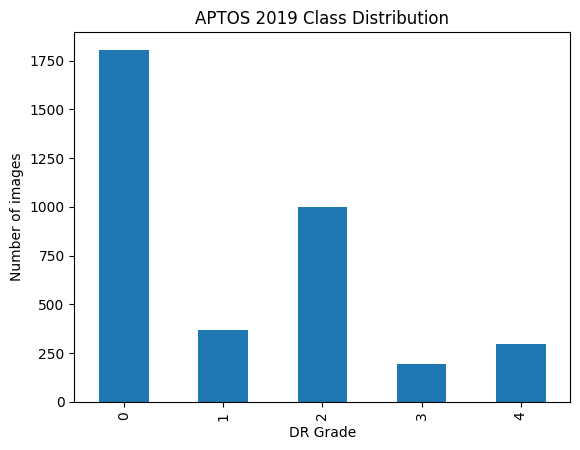

In [ ]:
import matplotlib.pyplot as plt

df['diagnosis'].value_counts().sort_index().plot(kind='bar')
plt.xlabel("DR Grade")
plt.ylabel("Number of images")
plt.title("APTOS 2019 Class Distribution")
plt.show()

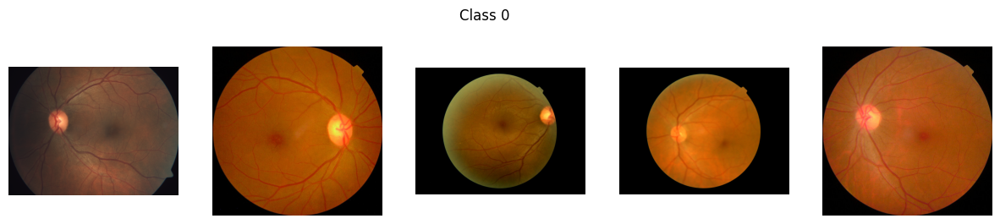

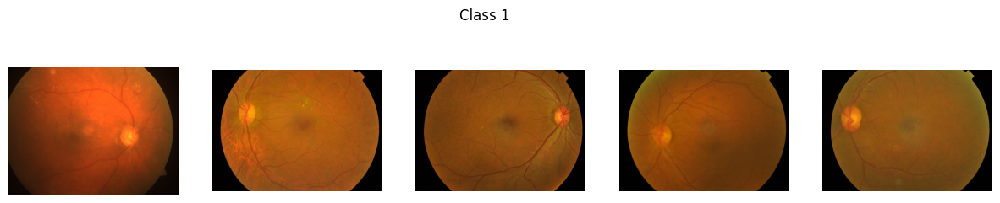

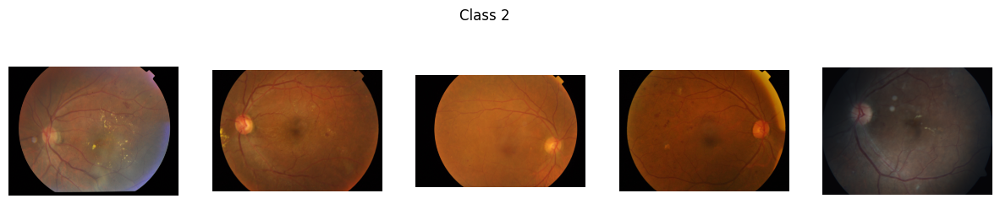

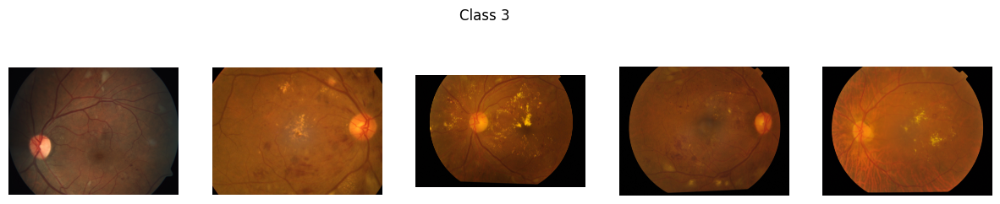

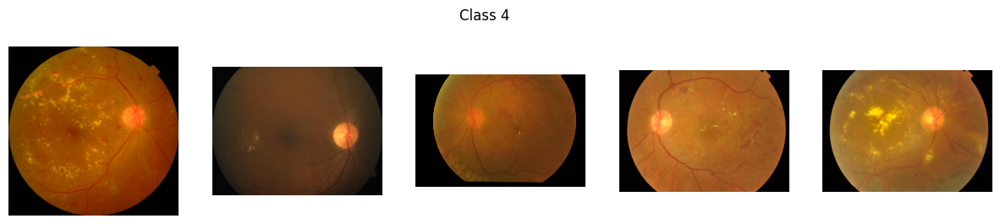

In [ ]:
import cv2
import matplotlib.pyplot as plt

def show_samples(df, cls, n=5):
    samples = df[df['diagnosis'] == cls].sample(n, random_state=1)
    fig, axes = plt.subplots(1, n, figsize=(15, 3))
    for ax, (_, row) in zip(axes, samples.iterrows()):
        path = f"data/aptos/train_images/{row['id_code']}.png"
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV loads as BGR, matplotlib wants RGB
        ax.imshow(img)
        ax.axis('off')
    plt.suptitle(f"Class {cls}")
    plt.show()

for c in range(5):
    show_samples(df, c)

In [ ]:
import numpy as np

def crop_to_circle(img, tol=7):
    """Remove the black border around the circular fundus image."""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    mask = gray > tol
    if mask.sum() == 0:
        return img
    coords = np.argwhere(mask)
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1
    return img[y0:y1, x0:x1]

def apply_clahe(img):
    """Improve contrast — fundus images often look washed out or uneven."""
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l = clahe.apply(l)
    lab = cv2.merge((l, a, b))
    return cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

def preprocess_image(path, size=224):
    img = cv2.imread(path)
    img = crop_to_circle(img)
    img = apply_clahe(img)
    img = cv2.resize(img, (size, size))
    return img

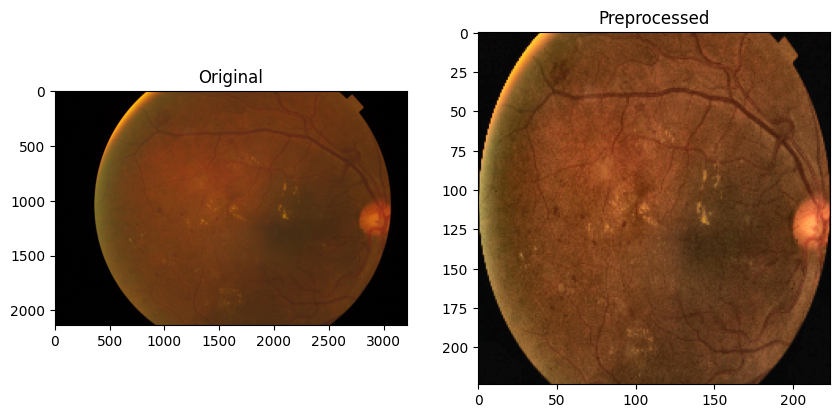

In [ ]:
sample_path = f"data/aptos/train_images/{df['id_code'].iloc[0]}.png"
original = cv2.imread(sample_path)
processed = preprocess_image(sample_path)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original")
axes[1].imshow(cv2.cvtColor(processed, cv2.COLOR_BGR2RGB))
axes[1].set_title("Preprocessed")
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(
    df, test_size=0.15, stratify=df['diagnosis'], random_state=42
)

print("Train shape:", train_df.shape)
print("Val shape:", val_df.shape)
print("\nTrain distribution:\n", train_df['diagnosis'].value_counts(normalize=True).sort_index().round(3))
print("\nVal distribution:\n", val_df['diagnosis'].value_counts(normalize=True).sort_index().round(3))

Train shape: (3112, 2)
Val shape: (550, 2)

Train distribution:
 diagnosis
0    0.493
1    0.101
2    0.273
3    0.053
4    0.081
Name: proportion, dtype: float64

Val distribution:
 diagnosis
0    0.493
1    0.102
2    0.273
3    0.053
4    0.080
Name: proportion, dtype: float64


In [ ]:
train_df.to_csv("data/train_split.csv", index=False)
val_df.to_csv("data/val_split.csv", index=False)

In [ ]:
mkdir -p src notebooks

In [ ]:
%%writefile src/preprocessing.py
import cv2
import numpy as np

def crop_to_circle(img, tol=7):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    mask = gray > tol
    if mask.sum() == 0:
        return img
    coords = np.argwhere(mask)
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1
    return img[y0:y1, x0:x1]

def apply_clahe(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l = clahe.apply(l)
    lab = cv2.merge((l, a, b))
    return cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

def preprocess_image(path, size=224):
    img = cv2.imread(path)
    img = crop_to_circle(img)
    img = apply_clahe(img)
    img = cv2.resize(img, (size, size))
    return img

Writing src/preprocessing.py


# DAY2


In [ ]:
import pandas as pd
import os

# 1. Did we resolve Case A vs Case B and build a df?
print("train_split.csv exists:", os.path.exists("data/train_split.csv"))
print("val_split.csv exists:", os.path.exists("data/val_split.csv"))

train_df = pd.read_csv("data/train_split.csv")
val_df = pd.read_csv("data/val_split.csv")

print("\nTrain shape:", train_df.shape)
print("Val shape:", val_df.shape)

# 2. The real class distribution numbers we need for today's loss-weighting decision
print("\nTrain class distribution:")
print(train_df['diagnosis'].value_counts().sort_index())
print("\nVal class distribution:")
print(val_df['diagnosis'].value_counts().sort_index())

train_split.csv exists: True
val_split.csv exists: True

Train shape: (3112, 2)
Val shape: (550, 2)

Train class distribution:
diagnosis
0    1534
1     314
2     849
3     164
4     251
Name: count, dtype: int64

Val class distribution:
diagnosis
0    271
1     56
2    150
3     29
4     44
Name: count, dtype: int64


In [ ]:
import timm
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import numpy as np
from src.preprocessing import preprocess_image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = timm.create_model('efficientnet_b0', pretrained=True, num_classes=5)
model = model.to(device)

model.safetensors: reconstructing file:   0%|          |  0.00B / 21.4MB            

model.safetensors: downloading bytes:           |  0.00B            

In [ ]:
for name, param in model.named_parameters():
    if "classifier" not in name and "fc" not in name:
        param.requires_grad = False

optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-3
)


# ===== Step 3: Weighted loss (class-imbalance handling) =====
class_counts = train_df['diagnosis'].value_counts().sort_index().values
class_weights = 1.0 / class_counts
class_weights = class_weights / class_weights.sum() * len(class_counts)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)

In [ ]:
from sklearn.metrics import cohen_kappa_score, recall_score

def compute_metrics(y_true, y_pred):
    qwk = cohen_kappa_score(y_true, y_pred, weights='quadratic')
    per_class_recall = recall_score(y_true, y_pred, average=None, labels=[0,1,2,3,4])
    return {
        "qwk": qwk,
        "recall_per_class": dict(zip(range(5), per_class_recall))
    }

In [ ]:
import csv
import os
from datetime import datetime

def log_experiment(log_path, run_name, metrics, notes=""):
    row = {
        "timestamp": datetime.now().isoformat(),
        "run_name": run_name,
        "qwk": metrics["qwk"],
        **{f"recall_class_{k}": v for k, v in metrics["recall_per_class"].items()},
        "notes": notes
    }
    file_exists = os.path.exists(log_path)
    with open(log_path, "a", newline="") as f:
        writer = csv.DictWriter(f, fieldnames=row.keys())
        if not file_exists:
            writer.writeheader()
        writer.writerow(row)

In [ ]:
import os
import cv2
from tqdm import tqdm

os.makedirs("data/aptos/train_images_preprocessed", exist_ok=True)

all_ids = train_df['id_code'].tolist() + val_df['id_code'].tolist()

for id_code in tqdm(all_ids):
    src = f"data/aptos/train_images/{id_code}.png"
    dst = f"data/aptos/train_images_preprocessed/{id_code}.png"
    if not os.path.exists(dst):
        img = preprocess_image(src, size=224)
        cv2.imwrite(dst, img)

100%|██████████| 3662/3662 [14:13<00:00,  4.29it/s]


In [ ]:
class DRDataset(Dataset):
    def __init__(self, df, img_dir, size=224):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.size = size

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = f"{self.img_dir}/{row['id_code']}.png"
        img = cv2.imread(img_path)                    # already preprocessed — no crop/CLAHE here anymore
        img = img.astype(np.float32) / 255.0
        img = torch.from_numpy(img).permute(2, 0, 1)

        label = int(row['diagnosis'])
        return img, label


In [ ]:
train_dataset = DRDataset(train_df, img_dir="data/aptos/train_images_preprocessed")
val_dataset = DRDataset(val_df, img_dir="data/aptos/train_images_preprocessed")

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True,
                           num_workers=2, persistent_workers=True, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False,
                         num_workers=2, persistent_workers=True, pin_memory=True)


In [ ]:
def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * imgs.size(0)
    return total_loss / len(loader.dataset)


In [ ]:
def validate(model, loader, criterion, device):
    model.eval()
    total_loss = 0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            total_loss += loss.item() * imgs.size(0)

            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    avg_loss = total_loss / len(loader.dataset)
    return avg_loss, all_preds, all_labels

In [ ]:
num_epochs = 3

for epoch in range(num_epochs):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_preds, val_labels = validate(model, val_loader, criterion, device)
    metrics = compute_metrics(val_labels, val_preds)

    print(f"Epoch {epoch+1}: train_loss={train_loss:.4f}, val_loss={val_loss:.4f}, QWK={metrics['qwk']:.4f}")
    print("Per-class recall:", metrics['recall_per_class'])

log_experiment("experiment_log.csv", "day2_head_only_sanity_check_v2", metrics,
                notes="frozen backbone, weighted CE, 3 epochs, cached preprocessing")

Epoch 1: train_loss=2.8043, val_loss=2.4634, QWK=0.3370
Per-class recall: {0: np.float64(0.5166051660516605), 1: np.float64(0.42857142857142855), 2: np.float64(0.28), 3: np.float64(0.4482758620689655), 4: np.float64(0.1590909090909091)}
Epoch 2: train_loss=2.0563, val_loss=2.0972, QWK=0.5110
Per-class recall: {0: np.float64(0.6531365313653137), 1: np.float64(0.42857142857142855), 2: np.float64(0.32), 3: np.float64(0.5172413793103449), 4: np.float64(0.20454545454545456)}
Epoch 3: train_loss=1.7843, val_loss=1.9382, QWK=0.5927
Per-class recall: {0: np.float64(0.7564575645756457), 1: np.float64(0.44642857142857145), 2: np.float64(0.29333333333333333), 3: np.float64(0.4827586206896552), 4: np.float64(0.2727272727272727)}


# Day 3


In [ ]:
for name, _ in model.named_parameters():
    print(name)

conv_stem.weight
bn1.weight
bn1.bias
blocks.0.0.conv_dw.weight
blocks.0.0.bn1.weight
blocks.0.0.bn1.bias
blocks.0.0.se.conv_reduce.weight
blocks.0.0.se.conv_reduce.bias
blocks.0.0.se.conv_expand.weight
blocks.0.0.se.conv_expand.bias
blocks.0.0.conv_pw.weight
blocks.0.0.bn2.weight
blocks.0.0.bn2.bias
blocks.1.0.conv_pw.weight
blocks.1.0.bn1.weight
blocks.1.0.bn1.bias
blocks.1.0.conv_dw.weight
blocks.1.0.bn2.weight
blocks.1.0.bn2.bias
blocks.1.0.se.conv_reduce.weight
blocks.1.0.se.conv_reduce.bias
blocks.1.0.se.conv_expand.weight
blocks.1.0.se.conv_expand.bias
blocks.1.0.conv_pwl.weight
blocks.1.0.bn3.weight
blocks.1.0.bn3.bias
blocks.1.1.conv_pw.weight
blocks.1.1.bn1.weight
blocks.1.1.bn1.bias
blocks.1.1.conv_dw.weight
blocks.1.1.bn2.weight
blocks.1.1.bn2.bias
blocks.1.1.se.conv_reduce.weight
blocks.1.1.se.conv_reduce.bias
blocks.1.1.se.conv_expand.weight
blocks.1.1.se.conv_expand.bias
blocks.1.1.conv_pwl.weight
blocks.1.1.bn3.weight
blocks.1.1.bn3.bias
blocks.2.0.conv_pw.weight
blocks.

In [ ]:
for name, param in model.named_parameters():
    if any(f"blocks.{i}" in name for i in [4, 5, 6]) or "classifier" in name or "conv_head" in name or "bn2" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

trainable = [n for n, p in model.named_parameters() if p.requires_grad]
print(f"Trainable params: {len(trainable)} out of {len(list(model.named_parameters()))}")

Trainable params: 125 out of 213


In [ ]:
backbone_params = [p for n, p in model.named_parameters() if p.requires_grad and "classifier" not in n]
head_params = [p for n, p in model.named_parameters() if p.requires_grad and "classifier" in n]

optimizer = torch.optim.Adam([
    {"params": backbone_params, "lr": 1e-5},
    {"params": head_params, "lr": 1e-3}
])

In [ ]:
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=2
)

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=20, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.3),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

val_transform = A.Compose([
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

In [ ]:
class DRDataset(Dataset):
    def __init__(self, df, img_dir, transform, size=224):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform
        self.size = size

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = f"{self.img_dir}/{row['id_code']}.png"
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        augmented = self.transform(image=img)
        img = augmented['image']

        label = int(row['diagnosis'])
        return img, label


train_dataset = DRDataset(train_df, img_dir="data/aptos/train_images_preprocessed", transform=train_transform)
val_dataset = DRDataset(val_df, img_dir="data/aptos/train_images_preprocessed", transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2, pin_memory=True)

In [ ]:
best_qwk = -1.0

def maybe_save_best(model, val_qwk, best_qwk, path="best_model.pth"):
    if val_qwk > best_qwk:
        torch.save(model.state_dict(), path)
        print(f"New best QWK: {val_qwk:.4f} — checkpoint saved.")
        return val_qwk
    return best_qwk

In [ ]:
num_epochs = 10

for epoch in range(num_epochs):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_preds, val_labels = validate(model, val_loader, criterion, device)
    metrics = compute_metrics(val_labels, val_preds)
    val_qwk = metrics['qwk']

    scheduler.step(val_qwk)
    best_qwk = maybe_save_best(model, val_qwk, best_qwk)

    current_lr = optimizer.param_groups[0]['lr']
    print(f"Epoch {epoch+1}: train_loss={train_loss:.4f}, val_loss={val_loss:.4f}, QWK={val_qwk:.4f}, LR={current_lr:.2e}")
    print("Per-class recall:", metrics['recall_per_class'])

    log_experiment("experiment_log.csv", f"day3_partial_unfreeze_epoch{epoch+1}", metrics,
                    notes="unfrozen blocks 4-6 + head, discriminative LR, augmentation, cached preprocessing")

New best QWK: 0.6484 — checkpoint saved.
Epoch 1: train_loss=1.8805, val_loss=2.0525, QWK=0.6484, LR=1.00e-05
Per-class recall: {0: np.float64(0.7896678966789668), 1: np.float64(0.5), 2: np.float64(0.26), 3: np.float64(0.27586206896551724), 4: np.float64(0.2727272727272727)}
New best QWK: 0.6888 — checkpoint saved.
Epoch 2: train_loss=1.5980, val_loss=1.9273, QWK=0.6888, LR=1.00e-05
Per-class recall: {0: np.float64(0.8376383763837638), 1: np.float64(0.44642857142857145), 2: np.float64(0.29333333333333333), 3: np.float64(0.3103448275862069), 4: np.float64(0.38636363636363635)}
New best QWK: 0.7174 — checkpoint saved.
Epoch 3: train_loss=1.3595, val_loss=1.8438, QWK=0.7174, LR=1.00e-05
Per-class recall: {0: np.float64(0.8597785977859779), 1: np.float64(0.48214285714285715), 2: np.float64(0.3), 3: np.float64(0.3103448275862069), 4: np.float64(0.3409090909090909)}
New best QWK: 0.7499 — checkpoint saved.
Epoch 4: train_loss=1.3055, val_loss=1.7619, QWK=0.7499, LR=1.00e-05
Per-class recall:

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Get predictions from your best checkpoint (epoch 9)
model.load_state_dict(torch.load("best_model.pth"))
_, val_preds, val_labels = validate(model, val_loader, criterion, device)

cm = confusion_matrix(val_labels, val_preds, labels=[0,1,2,3,4])
print("Confusion matrix (rows=true, cols=predicted):")
print(cm)

# Specifically: what is class 3 being predicted as?
class3_row = cm[3]
print("\nTrue class 3 predicted as:", dict(zip(range(5), class3_row)))

Confusion matrix (rows=true, cols=predicted):
[[247  17   7   0   0]
 [  7  28  12   4   5]
 [  6  38  62  27  17]
 [  0   2   6  10  11]
 [  0   5  13  10  16]]

True class 3 predicted as: {0: np.int64(0), 1: np.int64(2), 2: np.int64(6), 3: np.int64(10), 4: np.int64(11)}


In [ ]:
class_counts = train_df['diagnosis'].value_counts().sort_index().values
class_weights = 1.0 / class_counts
class_weights = class_weights / class_weights.sum() * len(class_counts)

# Targeted boost — only touch class 3
class_weights[3] *= 1.5   # start here; if class 3 recall still lags after retraining, try 2.0

class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

In [ ]:
model.load_state_dict(torch.load("best_model.pth"))

num_epochs = 5   # shorter run — you're fine-tuning the fix, not doing a full 10-epoch pass again
best_qwk = -1.0

for epoch in range(num_epochs):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_preds, val_labels = validate(model, val_loader, criterion, device)
    metrics = compute_metrics(val_labels, val_preds)
    val_qwk = metrics['qwk']

    scheduler.step(val_qwk)
    best_qwk = maybe_save_best(model, val_qwk, best_qwk, path="best_model_v2.pth")

    print(f"Epoch {epoch+1}: train_loss={train_loss:.4f}, val_loss={val_loss:.4f}, QWK={val_qwk:.4f}")
    print("Per-class recall:", metrics['recall_per_class'])

    log_experiment("experiment_log.csv", f"day3_class3_boost_epoch{epoch+1}", metrics,
                    notes="resumed from epoch9 checkpoint, class3 weight x1.5")

New best QWK: 0.7884 — checkpoint saved.
Epoch 1: train_loss=0.9261, val_loss=1.6315, QWK=0.7884
Per-class recall: {0: np.float64(0.9114391143911439), 1: np.float64(0.6071428571428571), 2: np.float64(0.3466666666666667), 3: np.float64(0.3103448275862069), 4: np.float64(0.45454545454545453)}
New best QWK: 0.7995 — checkpoint saved.
Epoch 2: train_loss=0.8660, val_loss=1.6140, QWK=0.7995
Per-class recall: {0: np.float64(0.9040590405904059), 1: np.float64(0.5178571428571429), 2: np.float64(0.4866666666666667), 3: np.float64(0.3793103448275862), 4: np.float64(0.38636363636363635)}
New best QWK: 0.8028 — checkpoint saved.
Epoch 3: train_loss=0.8621, val_loss=1.6183, QWK=0.8028
Per-class recall: {0: np.float64(0.915129151291513), 1: np.float64(0.5714285714285714), 2: np.float64(0.4533333333333333), 3: np.float64(0.3448275862068966), 4: np.float64(0.36363636363636365)}
Epoch 4: train_loss=0.8251, val_loss=1.6209, QWK=0.7826
Per-class recall: {0: np.float64(0.9188191881918819), 1: np.float64(0

In [ ]:
# Reload your best checkpoint if not already in memory
model.load_state_dict(torch.load("best_model.pth"))
model.eval()

# EfficientNet-B0 in timm: the last conv layer before global pooling is 'conv_head'
print(model.conv_head)

Conv2d(320, 1280, kernel_size=(1, 1), stride=(1, 1), bias=False)


In [ ]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None

        # Forward hook: capture the layer's output during the forward pass
        target_layer.register_forward_hook(self._save_activation)
        # Backward hook: capture the gradient flowing into this layer during backprop
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate(self, input_tensor, target_class=None):
        # Forward pass — get prediction
        output = self.model(input_tensor)

        if target_class is None:
            target_class = output.argmax(dim=1).item()  # explain the predicted class by default

        # Backward pass — compute gradients w.r.t. the target class's score
        self.model.zero_grad()
        class_score = output[0, target_class]
        class_score.backward()

        # Grad-CAM math: weight each activation channel by how much its gradient mattered on average
        gradients = self.gradients[0]        # shape: [channels, H, W]
        activations = self.activations[0]    # shape: [channels, H, W]

        weights = gradients.mean(dim=(1, 2))  # global-average-pool the gradients -> one weight per channel
        cam = torch.zeros(activations.shape[1:], dtype=torch.float32).to(activations.device)

        for i, w in enumerate(weights):
            cam += w * activations[i]

        cam = torch.relu(cam)  # only positive influence matters — negative values would suggest "evidence against"
        cam = cam / (cam.max() + 1e-8)  # normalize to 0-1 for visualization

        return cam.cpu().numpy(), target_class

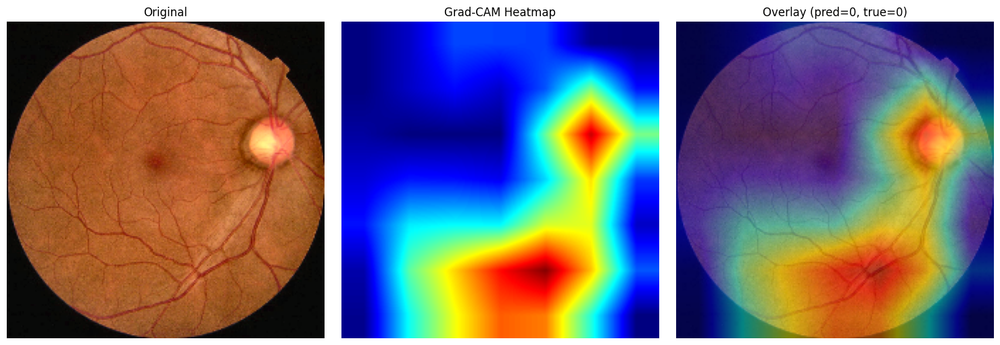

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_gradcam_overlay(image_path, model, cache_dir="data/aptos/train_images_preprocessed", size=224):
    gradcam = GradCAM(model, model.conv_head)

    # Load the already-preprocessed cached image (same pipeline as training)
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Prepare tensor input (must match training normalization)
    img_norm = img_rgb.astype(np.float32) / 255.0
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_norm = (img_norm - mean) / std
    input_tensor = torch.from_numpy(img_norm).permute(2, 0, 1).unsqueeze(0).float().to(device)

    cam, predicted_class = gradcam.generate(input_tensor)

    # Resize CAM (from conv layer's small spatial size, e.g. 7x7) up to full image size
    cam_resized = cv2.resize(cam, (size, size))

    # Turn the heatmap into a color overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    # Blend heatmap with original image
    overlay = (0.5 * img_rgb + 0.5 * heatmap).astype(np.uint8)

    return img_rgb, heatmap, overlay, predicted_class


# Try it on one validation image
sample_id = val_df.iloc[0]['id_code']
sample_path = f"data/aptos/train_images_preprocessed/{sample_id}.png"
true_label = val_df.iloc[0]['diagnosis']

original, heatmap, overlay, pred_class = apply_gradcam_overlay(sample_path, model)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(original); axes[0].set_title("Original"); axes[0].axis('off')
axes[1].imshow(heatmap); axes[1].set_title("Grad-CAM Heatmap"); axes[1].axis('off')
axes[2].imshow(overlay); axes[2].set_title(f"Overlay (pred={pred_class}, true={true_label})"); axes[2].axis('off')
plt.tight_layout()
plt.show()

/tmp/ipykernel_758/3663087881.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sample_ids = val_df.groupby('diagnosis').apply(lambda x: x.sample(1, random_state=42)).reset_index(drop=True)


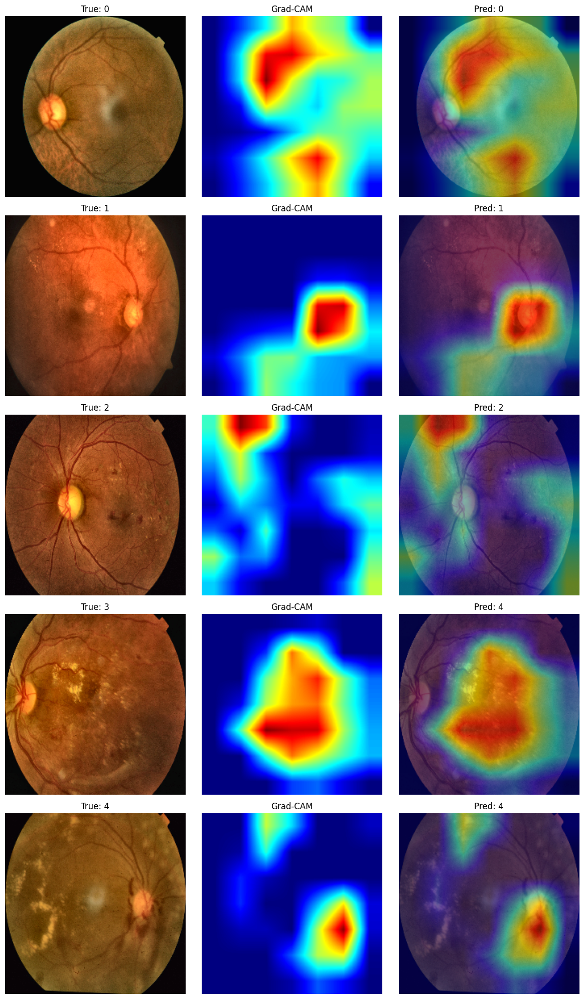

In [ ]:
import random

sample_ids = val_df.groupby('diagnosis').apply(lambda x: x.sample(1, random_state=42)).reset_index(drop=True)

fig, axes = plt.subplots(len(sample_ids), 3, figsize=(12, 4 * len(sample_ids)))

for i, row in sample_ids.iterrows():
    img_path = f"data/aptos/train_images_preprocessed/{row['id_code']}.png"
    original, heatmap, overlay, pred_class = apply_gradcam_overlay(img_path, model)

    axes[i, 0].imshow(original); axes[i, 0].set_title(f"True: {row['diagnosis']}"); axes[i, 0].axis('off')
    axes[i, 1].imshow(heatmap); axes[i, 1].set_title("Grad-CAM"); axes[i, 1].axis('off')
    axes[i, 2].imshow(overlay); axes[i, 2].set_title(f"Pred: {pred_class}"); axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
print(os.listdir('/content/drive/MyDrive'))

['Classroom', 'Screenshot 2025-11-29 230010.png', 'Google AI Studio', 'Downloads', 'Untitled video - Made with Clipchamp.mp4', 'DashImages', 'Screenshot_2026-02-08-12-43-18-70_40deb401b9ffe8e1df2f1cc5ba480b12.jpg', 'Untitled form.gform', 'Video Project 1.mp4', 'Colab Notebooks', 'CV.pdf', 'ass1.zip', 'Detailed Report + Roadmap.gdoc', 'Assignment.pdf', 'Frontend Brief — Explainable AI for Diabetic Retinopathy Screening.gdoc', 'dr-screening-ml']


In [ ]:
import zipfile

with zipfile.ZipFile('/content/drive/MyDrive/Colab Notebooks/A. Segmentation.zip', 'r') as zip_ref:
    zip_ref.extractall('data/idrid')

In [ ]:
import os

for root, dirs, files in os.walk('data/idrid'):
    print(root, "->", dirs[:5], files[:3])

data/idrid -> ['A. Segmentation'] []
data/idrid/A. Segmentation -> ['1. Original Images', '2. All Segmentation Groundtruths'] ['LICENSE.txt', 'CC-BY-4.0.txt']
data/idrid/A. Segmentation/1. Original Images -> ['a. Training Set', 'b. Testing Set'] []
data/idrid/A. Segmentation/1. Original Images/a. Training Set -> [] ['IDRiD_41.jpg', 'IDRiD_49.jpg', 'IDRiD_05.jpg']
data/idrid/A. Segmentation/1. Original Images/b. Testing Set -> [] ['IDRiD_79.jpg', 'IDRiD_69.jpg', 'IDRiD_66.jpg']
data/idrid/A. Segmentation/2. All Segmentation Groundtruths -> ['a. Training Set', 'b. Testing Set'] []
data/idrid/A. Segmentation/2. All Segmentation Groundtruths/a. Training Set -> ['3. Hard Exudates', '5. Optic Disc', '4. Soft Exudates', '2. Haemorrhages', '1. Microaneurysms'] []
data/idrid/A. Segmentation/2. All Segmentation Groundtruths/a. Training Set/3. Hard Exudates -> [] ['IDRiD_14_EX.tif', 'IDRiD_22_EX.tif', 'IDRiD_46_EX.tif']
data/idrid/A. Segmentation/2. All Segmentation Groundtruths/a. Training Set/5

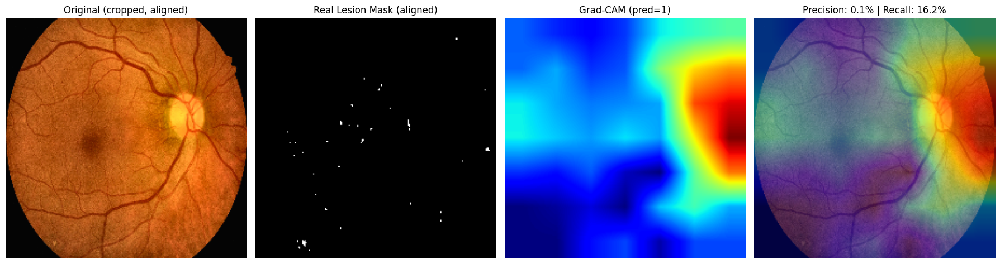

Precision: 0.13%, Recall: 16.16%, Predicted class: 1


In [ ]:
def get_crop_coords(img, tol=7):
    """Same logic as crop_to_circle, but returns coordinates instead of the cropped image."""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    mask = gray > tol
    if mask.sum() == 0:
        return 0, img.shape[0], 0, img.shape[1]
    coords = np.argwhere(mask)
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1
    return y0, y1, x0, x1


def load_combined_lesion_mask_aligned(image_id, crop_coords, size=224,
                                        base_dir="data/idrid/A. Segmentation/2. All Segmentation Groundtruths/a. Training Set"):
    y0, y1, x0, x1 = crop_coords
    lesion_folders = {"1. Microaneurysms": "MA", "2. Haemorrhages": "HE",
                       "3. Hard Exudates": "EX", "4. Soft Exudates": "SE"}

    combined = np.zeros((size, size), dtype=np.float32)
    for folder, suffix in lesion_folders.items():
        mask_path = f"{base_dir}/{folder}/{image_id}_{suffix}.tif"
        if os.path.exists(mask_path):
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            mask_cropped = mask[y0:y1, x0:x1]          # apply the SAME crop as the image
            mask_resized = cv2.resize(mask_cropped, (size, size))
            combined = np.maximum(combined, (mask_resized > 0).astype(np.float32))
    return combined


def compare_gradcam_to_lesions_v2(image_id, model, size=224):
    img_path = f"data/idrid/A. Segmentation/1. Original Images/a. Training Set/{image_id}.jpg"
    raw_img = cv2.imread(img_path)

    # Get crop coords ONCE from the raw image, reuse for both image and mask
    crop_coords = get_crop_coords(raw_img)
    y0, y1, x0, x1 = crop_coords
    img_cropped = raw_img[y0:y1, x0:x1]
    img_cropped = apply_clahe(img_cropped)
    img_resized = cv2.resize(img_cropped, (size, size))
    img_rgb = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)

    img_norm = img_rgb.astype(np.float32) / 255.0
    mean = np.array([0.485, 0.456, 0.406]); std = np.array([0.229, 0.224, 0.225])
    img_norm = (img_norm - mean) / std
    input_tensor = torch.from_numpy(img_norm).permute(2, 0, 1).unsqueeze(0).float().to(device)

    gradcam = GradCAM(model, model.conv_head)
    cam, pred_class = gradcam.generate(input_tensor)
    cam_resized = cv2.resize(cam, (size, size))

    lesion_mask = load_combined_lesion_mask_aligned(image_id, crop_coords, size=size)

    # Two metrics now: precision (as before) AND recall (more informative for sparse masks)
    hot_threshold = np.percentile(cam_resized, 75)
    hot_mask = (cam_resized >= hot_threshold).astype(np.float32)
    precision = (hot_mask * lesion_mask).sum() / (hot_mask.sum() + 1e-8)
    recall = (hot_mask * lesion_mask).sum() / (lesion_mask.sum() + 1e-8)

    fig, axes = plt.subplots(1, 4, figsize=(18, 5))
    axes[0].imshow(img_rgb); axes[0].set_title("Original (cropped, aligned)"); axes[0].axis('off')
    axes[1].imshow(lesion_mask, cmap='gray'); axes[1].set_title("Real Lesion Mask (aligned)"); axes[1].axis('off')
    axes[2].imshow(cam_resized, cmap='jet'); axes[2].set_title(f"Grad-CAM (pred={pred_class})"); axes[2].axis('off')
    axes[3].imshow(img_rgb); axes[3].imshow(cam_resized, cmap='jet', alpha=0.5); axes[3].set_title(f"Precision: {precision:.1%} | Recall: {recall:.1%}"); axes[3].axis('off')
    plt.tight_layout()
    plt.show()

    return precision, recall, pred_class


precision, recall, pred_class = compare_gradcam_to_lesions_v2("IDRiD_41", model)
print(f"Precision: {precision:.2%}, Recall: {recall:.2%}, Predicted class: {pred_class}")

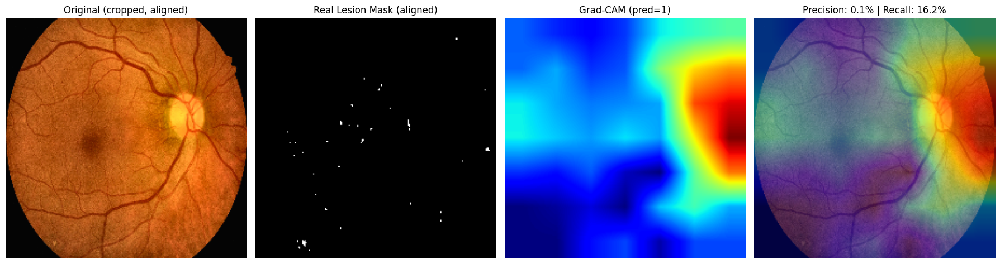

IDRiD_41: precision=0.13%, recall=16.16%, pred_class=1


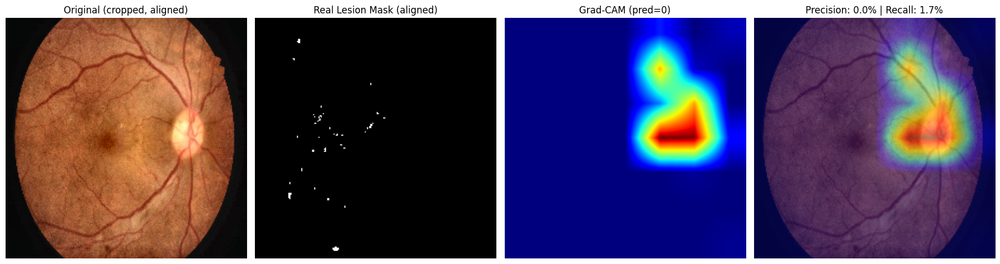

IDRiD_05: precision=0.02%, recall=1.72%, pred_class=0


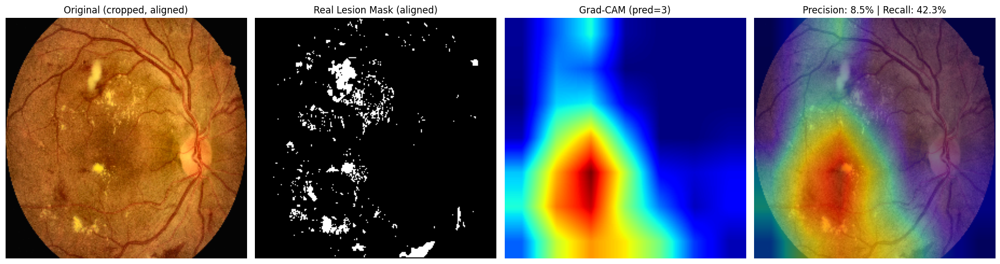

IDRiD_49: precision=8.51%, recall=42.32%, pred_class=3


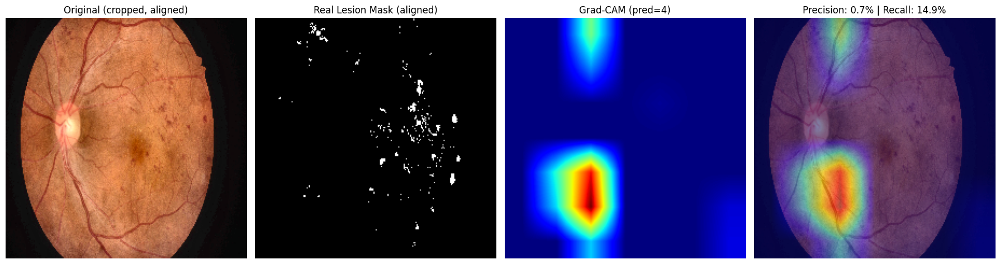

IDRiD_53: precision=0.73%, recall=14.89%, pred_class=4


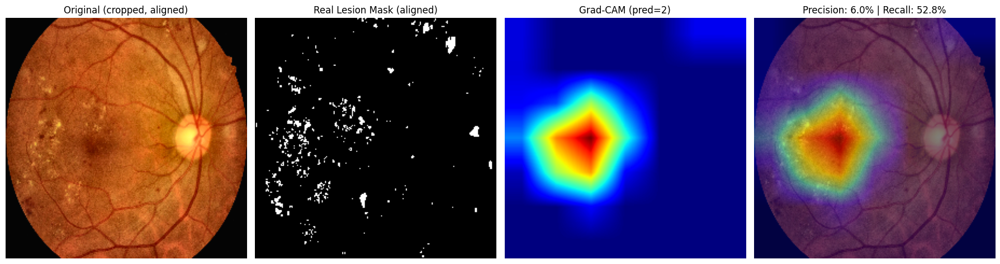

IDRiD_18: precision=6.02%, recall=52.76%, pred_class=2

Average recall across 5 images: 25.57%
Random-chance baseline (since hot mask ≈ top 25% of pixels): ~25%


In [ ]:
image_ids = ["IDRiD_41", "IDRiD_05", "IDRiD_49", "IDRiD_53", "IDRiD_18"]

results = []
for img_id in image_ids:
    precision, recall, pred_class = compare_gradcam_to_lesions_v2(img_id, model)
    results.append({"id": img_id, "precision": precision, "recall": recall, "pred_class": pred_class})
    print(f"{img_id}: precision={precision:.2%}, recall={recall:.2%}, pred_class={pred_class}")

avg_recall = np.mean([r["recall"] for r in results])
print(f"\nAverage recall across {len(image_ids)} images: {avg_recall:.2%}")
print("Random-chance baseline (since hot mask ≈ top 25% of pixels): ~25%")

In [ ]:
import cv2
import numpy as np
import torch
import base64
from io import BytesIO
from PIL import Image

CLASS_LABELS = {
    0: "No DR",
    1: "Mild DR",
    2: "Moderate DR",
    3: "Severe DR",
    4: "Proliferative DR"
}

def predict_and_explain(image_path, model, device, size=224, save_path=None):
    """
    Takes a raw fundus image path, returns prediction + Grad-CAM overlay.
    This is the function the /predict API endpoint will call directly.
    """
    model.eval()

    # 1. Preprocess (same pipeline as training: crop + CLAHE + resize)
    img_bgr = cv2.imread(image_path)
    img_processed = preprocess_image(image_path, size=size)  # your Day 1 function
    img_rgb = cv2.cvtColor(img_processed, cv2.COLOR_BGR2RGB)

    # 2. Normalize for model input
    img_norm = img_rgb.astype(np.float32) / 255.0
    mean = np.array([0.485, 0.456, 0.406]); std = np.array([0.229, 0.224, 0.225])
    img_norm = (img_norm - mean) / std
    input_tensor = torch.from_numpy(img_norm).permute(2, 0, 1).unsqueeze(0).float().to(device)

    # 3. Get prediction + class probabilities
    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = torch.softmax(outputs, dim=1)[0].cpu().numpy()
    predicted_class = int(np.argmax(probabilities))
    confidence = float(probabilities[predicted_class])

    # 4. Generate Grad-CAM (needs gradients, so run separately from the no_grad block above)
    gradcam = GradCAM(model, model.conv_head)
    cam, _ = gradcam.generate(input_tensor, target_class=predicted_class)
    cam_resized = cv2.resize(cam, (size, size))

    # 5. Build the overlay image
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = (0.5 * img_rgb + 0.5 * heatmap).astype(np.uint8)

    # 6. Save overlay to disk (for the API to serve as a URL) and/or return as base64
    overlay_pil = Image.fromarray(overlay)
    if save_path:
        overlay_pil.save(save_path)

    buffer = BytesIO()
    overlay_pil.save(buffer, format="PNG")
    overlay_base64 = base64.b64encode(buffer.getvalue()).decode("utf-8")

    # 7. Return in the exact shape the frontend team's API contract expects
    result = {
        "predicted_class": predicted_class,
        "predicted_label": CLASS_LABELS[predicted_class],
        "confidence": round(confidence, 4),
        "class_probabilities": {str(i): round(float(p), 4) for i, p in enumerate(probabilities)},
        "gradcam_overlay_base64": overlay_base64,   # or use save_path + a URL if serving files instead
    }

    return result

In [ ]:
result = predict_and_explain(
    image_path="data/aptos/train_images/025a169a0bb0.png",
    model=model,
    device=device,
    save_path="test_overlay.png"
)

print("Predicted:", result["predicted_label"])
print("Confidence:", result["confidence"])
print("Class probabilities:", result["class_probabilities"])
# result["gradcam_overlay_base64"] is a long string — don't print it, just confirm it exists:
print("Overlay generated:", len(result["gradcam_overlay_base64"]) > 0)

Predicted: Proliferative DR
Confidence: 0.8903
Class probabilities: {'0': 0.0041, '1': 0.0856, '2': 0.02, '3': 0.0, '4': 0.8903}
Overlay generated: True


In [ ]:
# 1. Mount Drive
from google.colab import drive
drive.mount('/content/drive')

# 2. Create a permanent project folder in Drive
import os
drive_project_path = "/content/drive/MyDrive/dr-screening-ml"
os.makedirs(drive_project_path, exist_ok=True)

# 3. Copy everything important from Colab's temporary disk into Drive
import shutil

items_to_move = [
    "src",                                   # your preprocessing.py code
    "data/train_split.csv",
    "data/val_split.csv",
    "data/aptos/train_images_preprocessed",  # the expensive cache — this is the big time-saver
    "best_model.pth",
    "experiment_log.csv",
]

for item in items_to_move:
    src_path = item
    dst_path = os.path.join(drive_project_path, item)
    if os.path.exists(src_path):
        os.makedirs(os.path.dirname(dst_path), exist_ok=True)
        if os.path.isdir(src_path):
            shutil.copytree(src_path, dst_path, dirs_exist_ok=True)
        else:
            shutil.copy(src_path, dst_path)
        print(f"Copied: {item}")
    else:
        print(f"Skipped (not found): {item}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Copied: src
Copied: data/train_split.csv
Copied: data/val_split.csv
Copied: data/aptos/train_images_preprocessed
Copied: best_model.pth
Copied: experiment_log.csv


In [ ]:
from google.colab import files
files.download("best_model.pth")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from sklearn.metrics import cohen_kappa_score
import numpy as np

confidences, corrects = [], []

for _, row in val_df.iterrows():
    img_path = f"data/aptos/train_images_preprocessed/{row['id_code']}.png"
    result = predict_and_explain(img_path, model, device)  # your existing Colab function from Day 4
    confidences.append(result["confidence"])
    corrects.append(result["predicted_class"] == row['diagnosis'])

confidences = np.array(confidences)
corrects = np.array(corrects)

print(f"{'Threshold':<12}{'Kept':<10}{'Accuracy among kept'}")
for t in [0.3, 0.4, 0.5, 0.6, 0.7]:
    mask = confidences >= t
    if mask.sum() > 0:
        acc = corrects[mask].mean()
        print(f"{t:<12}{mask.sum():<10}{acc:.2%}")

Threshold   Kept      Accuracy among kept
0.3         547       57.40%
0.4         513       59.84%
0.5         466       63.52%
0.6         398       67.09%
0.7         350       70.86%
